# Capstone Project 2

## NYC TLC Trip Record Data

# Introduction

The New York City Taxi and Limousine Commission (TLC), created in 1971, is the agency responsible for licensing and regulating New York City's Medallion (Yellow) taxi cabs, for-hire vehicles (community-based liveries, black cars and luxury limousines), commuter vans, and paratransit vehicles.

Understanding passenger behavior and operational performance is crucial for enhancing service quality, optimizing operational efficiency, and increasing customer satisfaction. Insights derived from this analysis can guide strategic decisions in areas such as scheduling, pricing, marketing, and service improvements.

# Problem

In the taxi industry, understanding customer demand patterns, regional preferences, and factors influencing customer satisfaction (such as through tips) are key to optimizing operations and increasing profitability. By evaluating when and where services are most needed and what encourages customers to show extra appreciation, companies can make more informed decisions regarding resource allocation, pricing, and customer service initiatives.

# Goals

To provide insights to stakeholders to assist in strategies or decision-making related to the following:

- Understanding trip distribution based on time and location to Optimize taxi fleet distribution.

- Understanding customer behaviour and preferences to enhance customer loyalty and satisfaction.

- Identifying fare revenue to analyses to maximize revenue by adjusting the price.

- Identifying tip behaviours that encourage passenger to pay tips.

# Import Library

In [126]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import geopandas as gpd
import folium
from folium import Choropleth

from scipy.stats import mannwhitneyu, kruskal

import plotly.express as px

import warnings
warnings.filterwarnings("ignore")

pd.set_option("display.max_columns", 30)
color = sns.color_palette("Set2")

## Load Dataset

- We load the data that we already cleaned from data_preparation.ipynb file

In [86]:
# Load Dataset Trip
df= pd.read_csv("../data/clean_data/NYC_Trip_Data_Clean.csv")

df['lpep_pickup_datetime'] = pd.to_datetime(df['lpep_pickup_datetime'])
df['lpep_dropoff_datetime'] = pd.to_datetime(df['lpep_dropoff_datetime'])

In [87]:
pd.DataFrame({
    'feature': df.columns.values,
    'data_type': df.dtypes.values,
    'null_value(%)': df.isna().mean().values * 100,
    'neg_value(%)': [len(df[col][df[col] < 0]) / len(df) * 100 if col in df.select_dtypes(include=[np.number]).columns else 0 for col in df.columns],
    '0_value(%)': [len(df[col][df[col] == 0]) / len(df) * 100 if col in df.select_dtypes(include=[np.number]).columns else 0 for col in df.columns],
    'duplicate' : df.duplicated().sum(),
    'n_unique': df.nunique().values,
    'sample_unique': [df[col].unique() for col in df.columns]}
).round(3)

,feature,data_type,null_value(%),neg_value(%),0_value(%),duplicate,n_unique,sample_unique
0,Unnamed: 0,int64,0.0,0.0,0.002,0,60828,"[0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14..."
1,lpep_pickup_datetime,datetime64[ns],0.0,0.0,0.000,0,59635,"[2023-01-01 00:26:10, 2023-01-01 00:51:03, 202..."
2,lpep_dropoff_datetime,datetime64[ns],0.0,0.0,0.000,0,59620,"[2023-01-01 00:37:11, 2023-01-01 00:57:49, 202..."
3,RatecodeID,object,0.0,0.0,0.000,0,4,"[Standard rate, Negotiated fare, Newark Airpor..."
4,PULocationID,int64,0.0,0.0,0.000,0,194,"[166, 24, 41, 181, 255, 75, 66, 195, 83, 97, 7..."
5,DOLocationID,int64,0.0,0.0,0.000,0,243,"[143, 43, 238, 74, 262, 45, 75, 166, 140, 234,..."
6,passenger_count,object,0.0,0.0,0.000,0,5,"[1.0, 2.0, 4.0, 3.0, >4]"
7,trip_distance,float64,0.0,0.0,0.000,0,1704,"[2.58, 1.81, 1.3, 1.1, 2.78, 3.8, 1.88, 1.11, ..."
8,fare_amount,float64,0.0,0.0,0.000,0,2331,"[14.9, 10.7, 6.5, 6.0, 17.7, 19.1, 14.2, 7.2, ..."
9,tip_amount,float64,0.0,0.0,39.089,0,1415,"[4.03, 2.64, 1.7, 0.0, 4.85, 1.0, 3.0, 3.33, 4..."


- Because the data showed above is already cleaned, so we can proceed to use this data to analyze

# Load Map Data

- Load map data with another external data that i got from this link:
https://www.nyc.gov/site/tlc/about/tlc-trip-record-data.page

- From that link we can download all taxi_zones file so we can use map visualization feature in the pyton

- Load the .shp (shapefile) data with geopandas (First need to install geopandas module first)

In [88]:
# Taxi zone in shape file
sf= gpd.read_file("../data/ext_data/taxi_zones/taxi_zones.shp")

sf['geometry'] = sf['geometry'].to_crs('+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs')

display(sf.head(5))

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((-74.18445 40.69500, -74.18449 40.695..."
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,"MULTIPOLYGON (((-73.82338 40.63899, -73.82277 ..."
2,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((-73.84793 40.87134, -73.84725 40.870..."
3,4,0.043567,0.000112,Alphabet City,4,Manhattan,"POLYGON ((-73.97177 40.72582, -73.97179 40.725..."
4,5,0.092146,0.000498,Arden Heights,5,Staten Island,"POLYGON ((-74.17422 40.56257, -74.17349 40.562..."


# Data Analysis

In [89]:
df.head(5)

,Unnamed: 0,lpep_pickup_datetime,lpep_dropoff_datetime,RatecodeID,PULocationID,DOLocationID,passenger_count,trip_distance,fare_amount,tip_amount,payment_type,trip_type,PUBorough,PUZone,DOBorough,DOZone,time_zone,day_type,distance_category,duration,duration_category,speed,speed_category,fare_category,tip_category
0,0,2023-01-01 00:26:10,2023-01-01 00:37:11,Standard rate,166,143,1.0,2.58,14.9,4.03,Credit card,Street-hail,Manhattan,Morningside Heights,Manhattan,Lincoln Square West,Late Night,Weekend,3-6 miles,11.02,5-15 minutes,14.05,11-20 mph,<20$,1-5$
1,1,2023-01-01 00:51:03,2023-01-01 00:57:49,Standard rate,24,43,1.0,1.81,10.7,2.64,Credit card,Street-hail,Manhattan,Bloomingdale,Manhattan,Central Park,Late Night,Weekend,<2 miles,6.77,5-15 minutes,16.04,11-20 mph,<20$,1-5$
2,3,2023-01-01 00:13:14,2023-01-01 00:19:03,Standard rate,41,238,1.0,1.30,6.5,1.70,Credit card,Street-hail,Manhattan,Central Harlem,Manhattan,Upper West Side North,Late Night,Weekend,<2 miles,5.82,5-15 minutes,13.40,11-20 mph,<20$,1-5$
3,4,2023-01-01 00:33:04,2023-01-01 00:39:02,Standard rate,41,74,1.0,1.10,6.0,0.00,Credit card,Street-hail,Manhattan,Central Harlem,Manhattan,East Harlem North,Late Night,Weekend,<2 miles,5.97,5-15 minutes,11.06,11-20 mph,<20$,0$
4,5,2023-01-01 00:53:31,2023-01-01 01:11:04,Standard rate,41,262,1.0,2.78,17.7,0.00,Cash,Street-hail,Manhattan,Central Harlem,Manhattan,Yorkville East,Late Night,Weekend,3-6 miles,17.55,15-30 minutes,9.50,<10 mph,<20$,0$


# Trip Frequency Analysis

Understanding trip distribution based on time and location to Optimize taxi fleet distribution.

- To find out the trip distribution pattern, we can categorize the pattern based on the time and location of each pickup data during the January 2023 period.

- By knowing the trip distribution pattern, we will reach the final conclusion for the need to distribute the number of taxis in accordance with the data presented so that the expected results are more effective and optimal.

## Based on Location

- Showing NYC map with total pickup and dropoff for each location

- The coordinates used are Coordinate Reference System (CRS) so the id and geometry data will be converted to crs type with epsg code.

In [90]:
# Compute pickup and dropoff amount of each zone
pu_zones = df.groupby(['PULocationID'], as_index=False).size()
do_zones = df.groupby(['DOLocationID'], as_index=False).size()
# Making new geo data frame
pu_zones = gpd.GeoDataFrame(pd.merge(pu_zones, sf, left_on='PULocationID', right_on='LocationID'))
do_zones = gpd.GeoDataFrame(pd.merge(do_zones, sf, left_on='DOLocationID', right_on='LocationID'))

pu_zones = pu_zones.to_crs(epsg=3857)
do_zones = do_zones.to_crs(epsg=3857)

display(pu_zones.head(3),do_zones.head(3))

,PULocationID,size,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,3,5,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((-8220713.532 4993383.076, -8220638.4..."
1,7,1625,7,0.107417,0.000390,Astoria,7,Queens,"POLYGON ((-8226970.812 4978111.098, -8226872.3..."
2,9,10,9,0.099784,0.000338,Auburndale,9,Queens,"POLYGON ((-8213711.360 4977158.129, -8213693.1..."


,DOLocationID,size,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,21,1,0.116357,0.000782,Newark Airport,1,EWR,"POLYGON ((-8258175.511 4967457.200, -8258179.5..."
1,3,11,3,0.084341,0.000314,Allerton/Pelham Gardens,3,Bronx,"POLYGON ((-8220713.532 4993383.076, -8220638.4..."
2,4,63,4,0.043567,0.000112,Alphabet City,4,Manhattan,"POLYGON ((-8234500.207 4971984.011, -8234502.1..."


- Making map using folium and chropleth to show the count measure

In [91]:

nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)


min_pickup, max_pickup = pu_zones['size'].min(), pu_zones['size'].max()
min_dropoff, max_dropoff = do_zones['size'].min(), do_zones['size'].max()


folium.Choropleth(
    geo_data=pu_zones, 
    name='Pickup',
    data=pu_zones,
    columns=['PULocationID', 'size'],
    key_on='feature.properties.PULocationID',
    fill_color='Blues',
    threshold_scale=np.linspace(min_pickup, max_pickup, 6),
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Pickup Amount",
).add_to(nyc_map)


folium.GeoJson(
    pu_zones,
    name='Pickup Locations',
    tooltip=folium.GeoJsonTooltip(
        fields=['size', 'zone','borough'],  
        aliases=['Total', 'Pickup Location:', 'Borough:'],
        localize=True,
    ),
    style_function=lambda x: {'fillColor': 'blue', 'color': 'black', 'weight': 0.5, 'fillOpacity': 0.0}  # Make it fully transparent
).add_to(nyc_map)


folium.Choropleth(
    geo_data=do_zones,
    name='Dropoff',
    data=do_zones,
    columns=['DOLocationID', 'size'],
    key_on='feature.properties.DOLocationID',
    fill_color='Greens',
    threshold_scale=np.linspace(min_dropoff, max_dropoff, 6),
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name="Dropoff Amount",
).add_to(nyc_map)


folium.GeoJson(
    do_zones,
    name='Dropoff Locations',
    tooltip=folium.GeoJsonTooltip(
        fields=['size', 'zone','borough'],  
        aliases=['Total', 'Dropoff Location:', 'Borough:'],
        localize=True,
    ),
    style_function=lambda x: {'fillColor': 'green', 'color': 'black', 'weight': 0.5, 'fillOpacity': 0.0}  # Make it fully transparent
).add_to(nyc_map)


folium.LayerControl().add_to(nyc_map)


nyc_map


- From the map above we can use sidebar on the right (with stack logo) to choose pickup or dropoff frequency only.

- The results on the map above show that frequency trips occur mostly in the borough of `manhattan` especially in the zone of `east harlem`. 

- The next most crowded borough is `Queens` with the largest area of `forest hill`.

- We can check again the trip distribution for each location with bar plot so we can see the comparison easier.

In [92]:
# count group by borough
agg_borough = df.groupby('PUBorough').agg(count=('PUBorough', 'count')).sort_values(by='count', ascending=False).reset_index()
# count group by zone
agg_zone = df.groupby('PUZone').agg(count=('PUZone', 'count')).sort_values(by='count', ascending=False).reset_index()

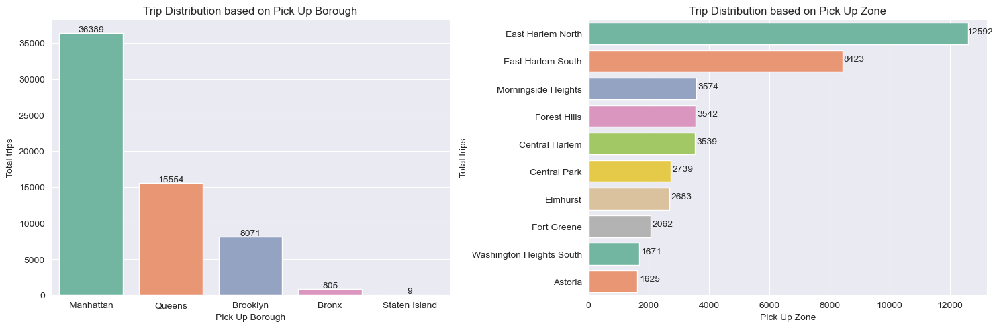

In [93]:
plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
bars = sns.barplot(x=agg_borough['PUBorough'], 
                   y=agg_borough['count'],
                   palette=color)
for idx, bar in enumerate(bars.patches):
    # Get X and Y placement of label from bar
    x_value = bar.get_x() + bar.get_width() / 2
    y_value = bar.get_height() + 200
    label = "{:.0f}".format(agg_borough['count'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center')

plt.title('Trip Distribution based on Pick Up Borough')
plt.xlabel('Pick Up Borough')
plt.ylabel('Total trips')

plt.subplot(1,2,2)
bars = sns.barplot(data=agg_zone.head(10),
                   y='PUZone', 
                   x='count',
                   palette=color)
for idx, bar in enumerate(bars.patches):
    y_value = bar.get_y() + bar.get_height() / 2
    x_value = bar.get_width() + 400
    label = "{:.0f}".format(agg_zone['count'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center')

plt.title('Trip Distribution based on Pick Up Zone')
plt.xlabel('Pick Up Zone')
plt.ylabel('Total trips')

plt.tight_layout()
plt.show()

- The results on the plot above still show that frequency trips occur mostly in the borough of `manhattan` especially in the zone of `east harlem` both north and south, but north side has the highest value with 12,592 passenger for a month. 

- The next most crowded borough is `Queens` with 15,554 passengers with the largest area of `forest hill` with 3,542 passengers for a month.

- The third one is borough `Brooklyn` with 8,071 passengers for a month.

## Based on Time

- There are several data that can be seen if related to time, where trip frequency data can be seen based on per year, month, day and even second.

- However, because this data only occurs in January 2023, the data can be viewed based on day and time.

In [94]:
# Total Trip Frequency in a month
trip_monthly = df.groupby(df['lpep_pickup_datetime'].dt.date).agg(trip_bydate=('lpep_pickup_datetime', 'count')).reset_index()
trip_monthly['lpep_pickup_datetime'] = pd.to_datetime(trip_monthly['lpep_pickup_datetime'])
trip_monthly['day_of_week'] = trip_monthly['lpep_pickup_datetime'].dt.day_name()

trip_dayly = trip_monthly.groupby('day_of_week').agg(trip_byday=('trip_bydate', 'sum'), day_count=('day_of_week', 'count'), avg_trip=('trip_bydate', 'mean')).reset_index()
trip_dayly['day_cat']= trip_dayly['day_of_week'].apply(lambda x: 'Weekend' if x in ['Saturday', 'Sunday'] else 'Weekdays')
# Total Trip Frequency dayly
trip_dayly_cat = trip_dayly.groupby('day_cat').agg(trip_bycat=('trip_byday', 'sum')).reset_index()

# Total Trip Frequency by Time
trip_hourly = df.groupby([df['lpep_pickup_datetime'].dt.hour, 'time_zone']).agg(trip_byhour=('lpep_pickup_datetime', 'count')).reset_index()
trip_bytimecat = df.groupby('time_zone').agg(trip_bytime=('time_zone', 'count')).reset_index()

# Merge
trip_merge = pd.merge(trip_monthly, trip_dayly, on='day_of_week', how='left')
trip_merge = pd.merge(trip_merge, trip_dayly_cat, on='day_cat', how='left')
trip_time_merge = pd.merge(trip_hourly, trip_bytimecat, on='time_zone', how='left')

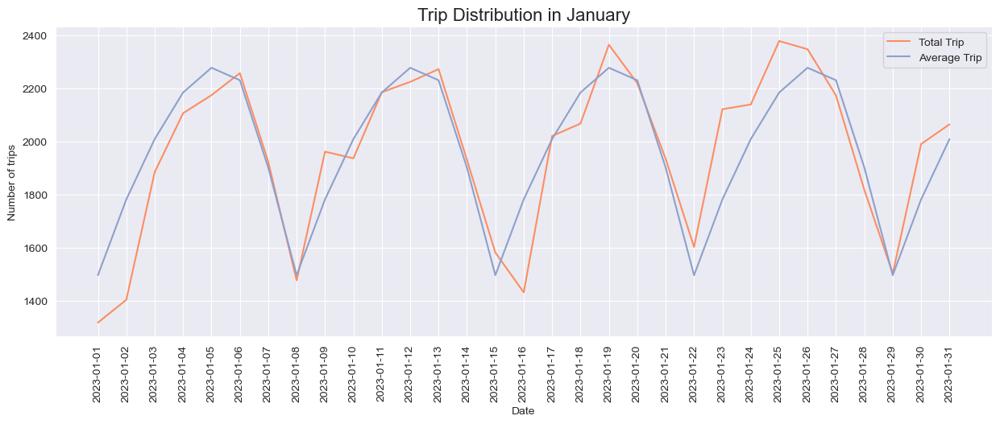

In [95]:
plt.figure(figsize=(15,5))
sns.set_style('darkgrid')

sns.lineplot(data=trip_merge,
             x='lpep_pickup_datetime', 
             y='trip_bydate', 
             color=color[1],
             label = 'Total Trip')

sns.lineplot(data=trip_merge,
             x='lpep_pickup_datetime', 
             y='avg_trip',
             color=color[2],
             label = 'Average Trip')

plt.title('Trip Distribution in January', fontsize=16)
plt.xlabel('Date')
plt.ylabel('Number of trips')
plt.xticks(trip_monthly['lpep_pickup_datetime'], rotation=90)

plt.show()

- If we observe from the line plot above, the trip frequency data experiences a regular up-and-down, that is, a decreasing trend only on 2 or 3 days and then an increase on the remaining days, both from the total trips and the average trips per day.

- The `highest` of trip frequency was on `January 25, 2023`, while the `lowest` frequency was on `January 1, 2023`, which was the day of the New Year celebration.

- It can be assumed from this data that the trip frequency decreases on holidays which weekends and increases on weekdays, but we will see in the next visualization.

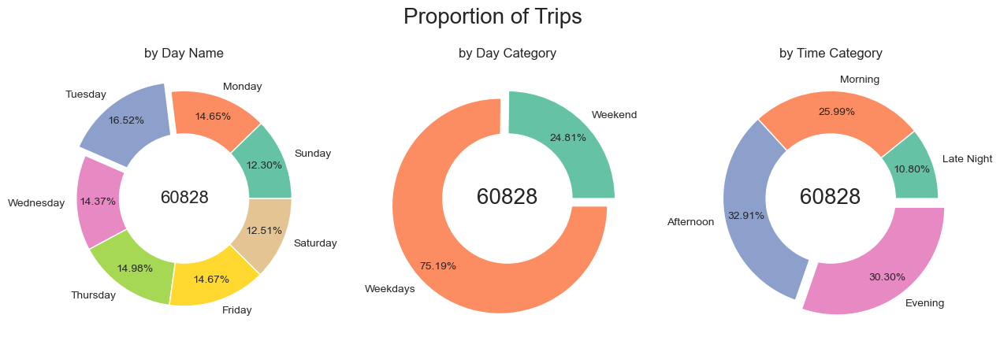

In [96]:
plt.figure(figsize=(15,5))
plt.suptitle('Proportion of Trips', fontsize=20)

#
plt.subplot(1,3,1)
plt.pie(x=trip_merge['trip_byday'].unique().tolist(), 
        labels=trip_merge['day_of_week'].unique().tolist(), 
        pctdistance=0.8, 
        autopct='%1.2f%%', 
        explode=(0,0,0.1,0,0,0,0), 
        colors=color)
fig = plt.gcf()
centre_circle = plt.Circle((0, 0), 0.6, fc='white')
fig.gca().add_artist(centre_circle)
plt.text(0, 0, trip_merge['trip_byday'].unique().sum(), ha='center', va='center', fontsize=16)
plt.title('by Day Name')

#
plt.subplot(1, 3, 2)
plt.pie(x=trip_merge['trip_bycat'].unique().tolist(), 
        labels=trip_merge['day_cat'].unique().tolist(), 
        pctdistance=0.8, 
        autopct='%1.2f%%', 
        explode=(0, 0.1), 
        colors=color)

fig = plt.gcf()
centre_circle = plt.Circle((0, 0), 0.6, fc='white')
fig.gca().add_artist(centre_circle)

plt.text(0, 0, trip_merge['trip_bydate'].sum(), ha='center', va='center', fontsize=20)
plt.title('by Day Category')

#
plt.subplot(1, 3, 3)

labels = trip_time_merge['time_zone'].unique().tolist()

num_labels = len(labels)

explode = [0] * num_labels 
if num_labels > 1:
    explode[-1] = 0.1 
plt.pie(x=trip_time_merge['trip_bytime'].unique().tolist(), 
        labels=labels, 
        pctdistance=0.8, 
        autopct='%1.2f%%', 
        explode=explode,  
        colors=color)

fig = plt.gcf()
centre_circle = plt.Circle((0, 0), 0.6, fc='white')
fig.gca().add_artist(centre_circle)

# Display total trips in the center
plt.text(0, 0, trip_time_merge['trip_byhour'].sum(), ha='center', va='center', fontsize=20)
plt.title('by Time Category')


plt.subplots_adjust(wspace=0.2) 
plt.show()

- Based on the graph above, the assumption from the explanation was correct that the decrease occurred on holidays which include weekends.

- `75.19%` of the trip frequency occurs on `weekdays` which is usually weekdays during which people work or go to school.

- The day with the largest proportion is `Tuesday` while the lowest is `Sunday` which every weekend the percentage reduced by 1%-2% from weekdays.

- The time of day that has the highest number occurs in the `afternoon` followed by `evening` (15-22 pm) which is the time when people return home from work in that afternoon and evening.

- We can see the distribution in more detailed time.

In [97]:
# Make day label
day_order = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
# Make cross to make the heatmap
cross = pd.crosstab(index=df['lpep_pickup_datetime'].dt.day_name(), columns=df['lpep_pickup_datetime'].dt.hour, margins=True).reindex(day_order)
cross.columns.name = None
cross.index.name = 'Day of Week'

melted_cross = cross.iloc[:,:-1].reset_index().melt(id_vars='Day of Week', var_name='hour', value_name='trips')
cross

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,All
Day of Week,,,,,,,,,,,,,,,,,,,,,,,,,
Sunday,283,265,222,185,138,74,59,97,124,219,324,425,477,490,505,562,541,507,518,443,379,293,194,159,7483
Monday,110,67,50,62,52,51,134,376,419,482,486,510,530,566,580,695,704,705,724,554,379,306,218,151,8911
Tuesday,85,50,44,35,21,51,186,532,649,651,573,531,548,538,651,723,787,775,798,630,459,325,243,163,10048
Wednesday,84,66,28,25,17,43,165,408,510,519,504,452,434,473,536,651,690,747,734,602,408,279,211,154,8740
Thursday,88,61,41,26,31,51,163,426,505,545,509,496,466,499,590,658,699,761,793,544,445,310,241,165,9113
Friday,136,81,38,36,28,42,140,430,463,470,478,455,413,447,594,695,689,713,719,570,423,323,291,251,8925
Saturday,210,178,123,104,85,45,47,108,196,253,355,434,468,515,455,581,568,510,535,475,419,325,317,302,7608


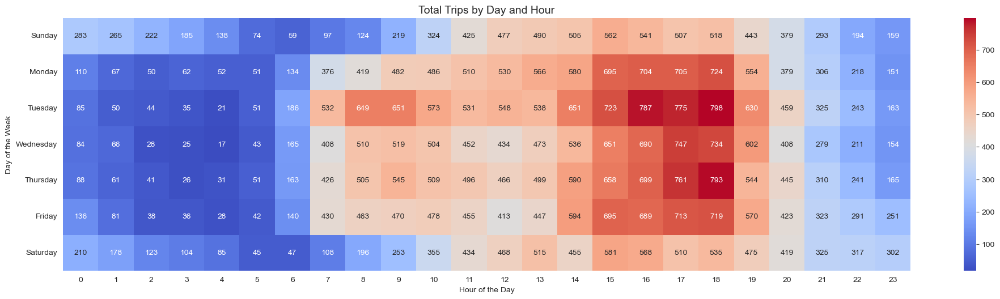

In [98]:
plt.figure(figsize=(20,10))

plt.subplot(2, 1, 2)
sns.heatmap(cross.iloc[:,:-1], cmap="coolwarm", annot=True, fmt='d')
plt.title('Total Trips by Day and Hour', fontsize=14)
plt.xlabel('Hour of the Day')
plt.ylabel('Day of the Week')

plt.tight_layout()
plt.show()

- Based on the heatmap above, it can be seen that passengers start to get crowded from `11pm` to `7pm` on weekdays.

- The most crowded hours start from around `2pm` to `6pm` on weekdays. It can be reach around 700 passengers when crowded hours with peaked at `Tuesday` on `6pm` on `799` passengers.

- While the lowest number occurs during the hours around `12-6am` with the lowest number on Thursday with `85` passengers.

- So it can be concluded through the distribution of this data that it is likely that the `highest majority of passengers are people returning from work based on the time pattern and peak hours` of people booked a taxi.

## Based on Location and Time

In [99]:
# Create a cross-tabulation for trips by hour for each borough
cross_borough = pd.crosstab(
    index=df['PUBorough'],  # Group by borough
    columns=df['lpep_pickup_datetime'].dt.hour,  # Group by hour
    margins=False  # Do not include margins
)

# Melt the cross-borough DataFrame to long format
melted_cross_borough = cross_borough.reset_index().melt(id_vars=['PUBorough'], var_name='hour', value_name='trips')

# Display the melted cross table
melted_cross_borough.head()


,PUBorough,hour,trips
0,Bronx,0,22
1,Brooklyn,0,218
2,Manhattan,0,280
3,Queens,0,476
4,Staten Island,0,0


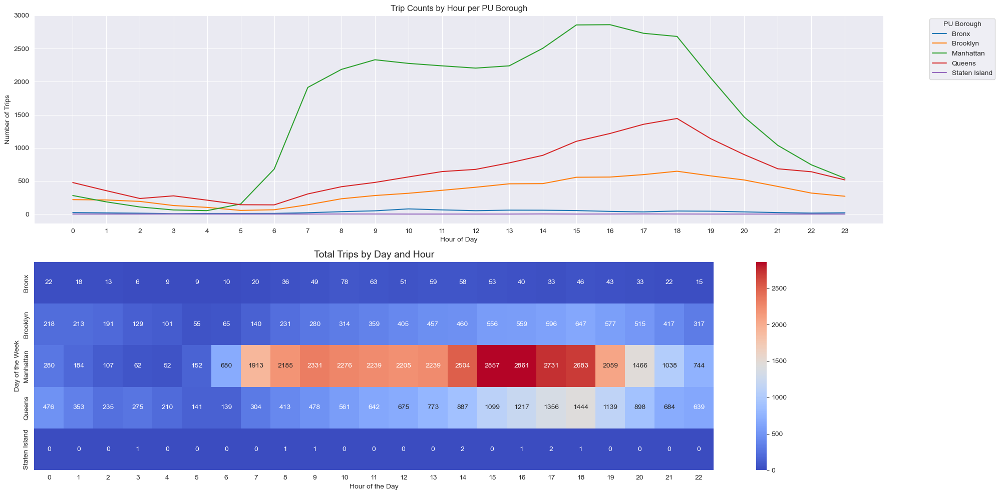

In [100]:
plt.figure(figsize=(20,10))

plt.subplot(2, 1, 1)
sns.lineplot(data=melted_cross_borough, 
             x='hour', 
             y='trips', 
             hue='PUBorough', 
             color=color)  # Choose a color palette
plt.title("Trip Counts by Hour per PU Borough")
plt.xlabel("Hour of Day")
plt.ylabel("Number of Trips")
plt.xticks(range(0, 24))  # Ensure all hours are shown
plt.legend(title="PU Borough", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.subplot(2, 1, 2)
sns.heatmap(cross_borough.iloc[:,:-1], cmap="coolwarm", annot=True, fmt='d')
plt.title('Total Trips by Day and Hour', fontsize=14)
plt.xlabel('Hour of the Day')
plt.ylabel('Day of the Week')

plt.tight_layout()
plt.show()

plt.show()


- Based on the data above, the majority occurs in the manhattan area where peak hours are already visible starting from `7am-7pm`. While other areas are not too visible significant differences.

- Manhattan is a hub for work and business in New York City, which is known as the financial capital of the world. So it is only natural that many people work in this area and the busy time is during working hours from 7am to 7pm.

# Passenger Behaviours and Preferences

Understanding customer behaviour and preferences to enhance customer loyalty and satisfaction.

- Passenger behaviour can be determined from the proportion of data based on distance, duration of trips, and the number of passengers on every trip.

In [101]:
# Count group by duration
agg_duration = df.groupby('duration_category').agg(count=('duration_category', 'count'), median=('duration', 'median')).sort_values(by='count', ascending=False).reset_index()
# Count group by distance
agg_distance = df.groupby('distance_category').agg(count=('distance_category', 'count'), median=('trip_distance', 'median')).sort_values(by='count', ascending=False).reset_index()
# Count group by passenger count
agg_passengercount= df.groupby('passenger_count').agg(count=('passenger_count', 'count')).sort_values(by='count', ascending=False).reset_index()

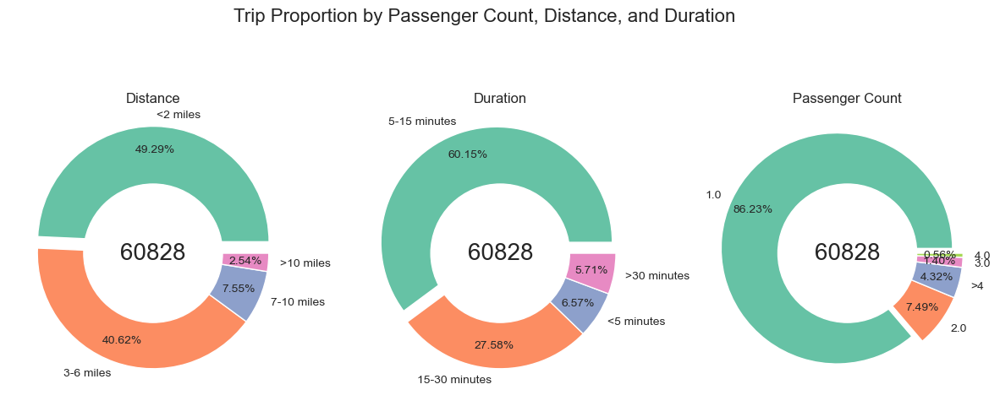

In [102]:
plt.figure(figsize=(15,6))
plt.suptitle('Trip Proportion by Passenger Count, Distance, and Duration', fontsize=16)
plt.subplot(1,3,1)

plt.pie(x=agg_distance['count'], 
        labels=agg_distance['distance_category'], 
        pctdistance=0.8, 
        autopct='%1.2f%%', 
        explode=(0.1,0,0,0), 
        colors=color)

fig = plt.gcf()
centre_circle = plt.Circle((0, 0), 0.6, fc='white')
fig.gca().add_artist(centre_circle)
plt.title('Distance')
plt.text(0, 0, len(df), ha='center', va='center', fontsize=20)

plt.subplot(1,3,2)
plt.pie(x=agg_duration['count'].unique().tolist(), 
        labels=agg_duration['duration_category'],   
        pctdistance=0.8, 
        autopct='%1.2f%%', 
        explode=(0.1,0,0,0), 
        colors=color)

fig = plt.gcf()
centre_circle = plt.Circle((0, 0), 0.6, fc='white')
fig.gca().add_artist(centre_circle)
plt.title('Duration')
plt.text(0, 0, len(df), ha='center', va='center', fontsize=20)

plt.subplot(1,3,3)
plt.pie(x=agg_passengercount['count'].unique().tolist(), 
        labels=agg_passengercount['passenger_count'],   
        pctdistance=0.8, 
        autopct='%1.2f%%',
        explode=(0.1,0,0,0,0), 
        colors=color)

fig = plt.gcf()
centre_circle = plt.Circle((0, 0), 0.6, fc='white')
fig.gca().add_artist(centre_circle)
plt.title('Passenger Count')
plt.text(0, 0, len(df), ha='center', va='center', fontsize=20)


plt.subplots_adjust(wspace=0.2) 
plt.show()

- The majority distance traveled by passengers is `less than 2 miles` at `49,29%` and the lowest distance is `more than 10 miles` at only `2,54%`.

- The duration of trips taken by passengers is mostly `5-15 minutes` with `60,15%` of trips while the least duration is `more than 30 minutes` with only `5,71%` of trips.

- The number of passengers booking a taxi is mostly one person passengers with `86,23%`.

- Each of these passenger behavior data confirms the previous conclusion on trip distribution where the majority of passengers who frequently use taxis are working people.

- Passenger preference can be determined from the proportion of data based on rate code, payment type, and trip type on every trip.

In [103]:
# Count group by rate code
agg_ratecode = df.groupby('RatecodeID').agg(count=('RatecodeID', 'count')).sort_values(by='count', ascending=False).reset_index()
agg_ratecode['RatecodeID'] = agg_ratecode['RatecodeID'].apply(lambda x: x if x == 'Standard rate' else 'Other')
agg_ratecode = agg_ratecode.groupby('RatecodeID').agg(count=('count', 'sum')).sort_values(by='count', ascending=False).reset_index()
# Count group by trip type
agg_triptype = df.groupby('trip_type').agg(count=('trip_type', 'count')).sort_values(by='count', ascending=False).reset_index()
# Count group by payment
agg_payment = df.groupby('payment_type').agg(count=('payment_type', 'count')).sort_values(by='count', ascending=False).reset_index()
agg_payment['payment_type'] = agg_payment['payment_type'].apply(lambda x: x if x == 'Credit card' or x == 'Cash' else 'Other')
agg_payment = agg_payment.groupby('payment_type').agg(count=('count', 'sum')).sort_values(by='count', ascending=False).reset_index()

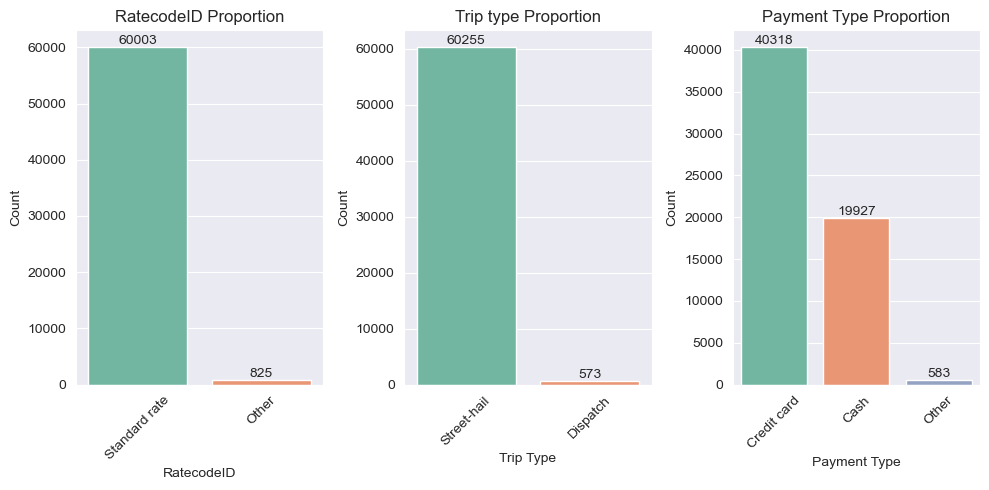

In [104]:
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
barplot= sns.barplot(x='RatecodeID', y='count', data=agg_ratecode, palette=color)

plt.title('RatecodeID Proportion')
plt.xlabel('RatecodeID')
plt.ylabel('Count')
plt.xticks(rotation=45) 

for p in barplot.patches:  
    barplot.annotate(format(int(p.get_height())), 
                      (p.get_x() + p.get_width() / 2., p.get_height()), 
                      ha='center', va='bottom', fontsize=10)

plt.subplot(1, 3, 2)
barplot= sns.barplot(x='trip_type', y='count', data=agg_triptype, palette=color)

plt.title('Trip type Proportion')
plt.xlabel('Trip Type')
plt.ylabel('Count')
plt.xticks(rotation=45) 

for p in barplot.patches:  
    barplot.annotate(format(int(p.get_height())), 
                      (p.get_x() + p.get_width() / 2., p.get_height()), 
                      ha='center', va='bottom', fontsize=10)

plt.subplot(1, 3, 3)
barplot= sns.barplot(x='payment_type', y='count', data=agg_payment, palette=color)

plt.title('Payment Type Proportion')
plt.xlabel('Payment Type')
plt.ylabel('Count')
plt.xticks(rotation=45) 

for p in barplot.patches:  
    barplot.annotate(format(int(p.get_height())), 
                      (p.get_x() + p.get_width() / 2., p.get_height()), 
                      ha='center', va='bottom', fontsize=10)


plt.tight_layout()  
plt.show()


- The distance that passenger covered is mostly using `standard rate` with trip type `street-hail` which is around `60,000` passengers.

- The preferred type of payment for passengers is by using a `credit card` with around `40,000` transactions while cash with around `19,000` transactions.

# Fare Amount Analysis

Identifying fare revenue to analyses to maximize revenue by adjusting the price.

- Count total and average for fare amount group by location, borough and zone.

- We sort values with the most trip by borough and zone route and then after that we sort value for fare revenue


In [105]:
# Count group by borough
trip_amount_borough = df.groupby(['PUBorough', 'DOBorough']).agg(trip_count=('PUBorough', 'count'),
                                                        total_fare=('fare_amount', 'sum'), 
                                                        avg_fare=('fare_amount', 'mean'),
                                                        total_tip=('tip_amount', 'sum'), 
                                                        avg_tip=('tip_amount', 'mean')).reset_index().sort_values(by=['trip_count'], ascending=False).head(10).round(2)
# Make route data
route = trip_amount_borough['PUBorough'] + " - " + trip_amount_borough['DOBorough']
trip_amount_borough.insert(0, 'Route', route)
trip_amount_borough.drop(columns=['PUBorough', 'DOBorough'], inplace=True)

In [106]:
# Count gropu by Zone
trip_amount_zone = df.groupby(['PUZone', 'DOZone']).agg(trip_count=('PUZone', 'count'),
                                                        total_fare=('fare_amount', 'sum'), 
                                                        avg_fare=('fare_amount', 'mean'),
                                                        total_tip=('tip_amount', 'sum'), 
                                                        avg_tip=('tip_amount', 'mean')).reset_index().sort_values(by=['trip_count'], ascending=False).head(10).round(2)
# Make route data
route = trip_amount_zone['PUZone'] + " - " + trip_amount_zone['DOZone']
trip_amount_zone.insert(0, 'Route', route)
trip_amount_zone.drop(columns=['PUZone', 'DOZone'], inplace=True)

## Based on Location

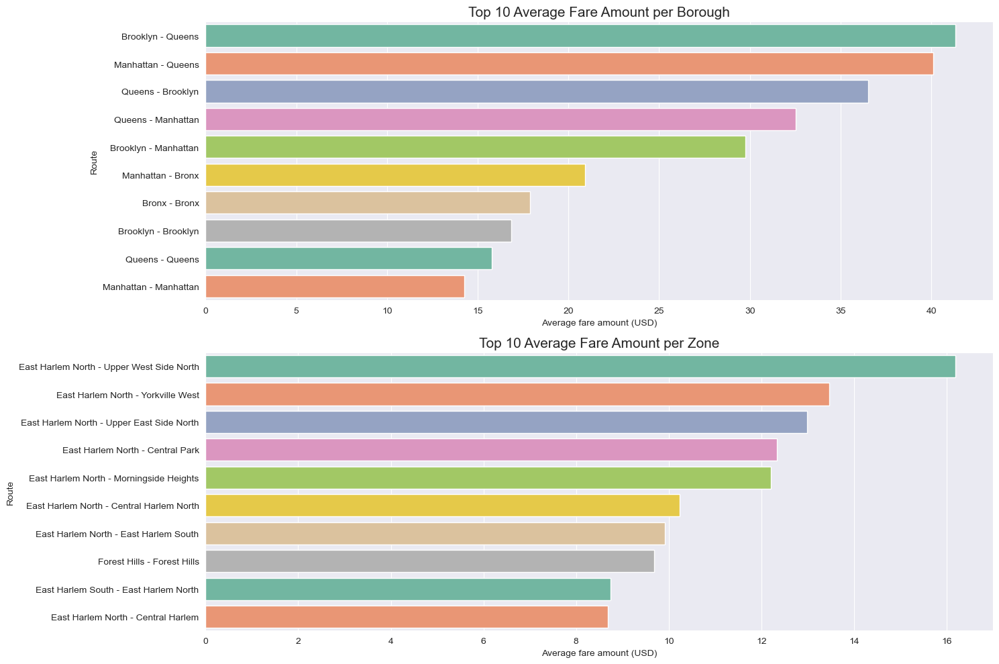

In [107]:
plt.figure(figsize=(15,10))

data_borough = trip_amount_borough.sort_values(by='avg_fare', ascending=False)
data_zone = trip_amount_zone.sort_values(by='avg_fare', ascending=False)

plt.subplot(2,1,1)
bars = sns.barplot(data=data_borough,
                   y='Route', 
                   x='avg_fare', 
                   palette=color)


plt.xlabel('Average fare amount (USD)')
plt.ylabel('Route')
plt.title('Top 10 Average Fare Amount per Borough', fontsize=15)

plt.subplot(2,1,2)
bars = sns.barplot(data=data_zone,
                   y='Route', 
                   x='avg_fare', 
                   palette=color)

    
plt.xlabel('Average fare amount (USD)')
plt.ylabel('Route')
plt.title('Top 10 Average Fare Amount per Zone', fontsize=15)

plt.tight_layout() 
plt.show()

- Based from the graph above, most popular route per borough with the highest average fare amount per borough is `Brooklyn-Queens` with average `40$`

- Based from the graph above, most popular route per zone with the highest average fare amount per borough is `East Harlem Nort-Upper West Side North` with average `16$`

## Based on Time

In [108]:
sort_time = ['Morning', 'Afternoon', 'Evening', 'Late Night']
amount_by_hour = df.groupby(df['lpep_pickup_datetime'].dt.hour).agg(total_fare_amount=('fare_amount', 'sum'), 
                                                                    avg_fare_amount=('fare_amount', 'mean'), 
                                                                    median_fare_amount=('fare_amount', 'median'),
                                                                    total_tip_amount=('tip_amount', 'sum'),
                                                                    avg_tip_amount=('tip_amount', 'mean'), 
                                                                    median_tip_amount=('tip_amount', 'median')).reset_index()

amount_by_time = df.groupby('time_zone').agg(total_fare_amount=('fare_amount', 'sum'), 
                                               avg_fare_amount=('fare_amount', 'mean'), 
                                               median_fare_amount=('fare_amount', 'median'),
                                               total_tip_amount=('tip_amount', 'sum'), 
                                               avg_tip_amount=('tip_amount', 'mean'), 
                                               median_tip_amount=('tip_amount', 'median')).reindex(sort_time).reset_index().round(2)

borough_amount_stack = df.pivot_table(index='PUBorough', columns='time_zone', values='fare_amount', aggfunc='median').fillna(0)
borough_amount_stack = borough_amount_stack[sort_time]

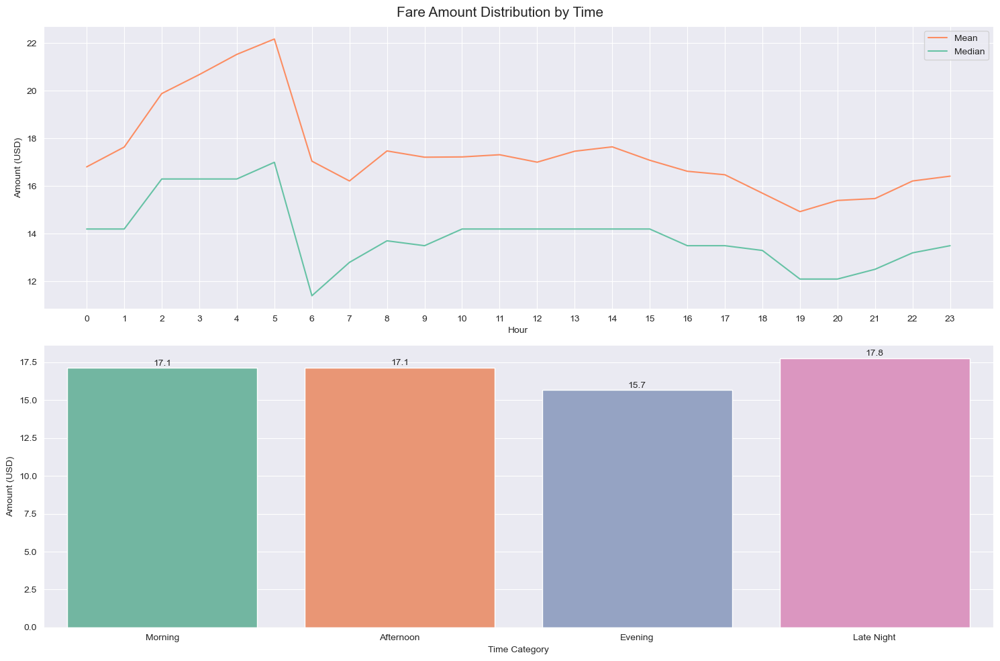

In [109]:
plt.figure(figsize=(15,10))
plt.suptitle('Fare Amount Distribution by Time', fontsize=15)

plt.subplot(2,1,1)
sns.lineplot(data=amount_by_hour, 
             x='lpep_pickup_datetime', 
             y='avg_fare_amount', 
             color=color[1],
             label = 'Mean')
sns.lineplot(data=amount_by_hour, 
             x='lpep_pickup_datetime', 
             y='median_fare_amount', 
             color=color[0],
             label = 'Median')
plt.xlabel('Hour')
plt.xticks(np.arange(0,24,1))
plt.ylabel('Amount (USD)')


plt.subplot(2,1,2)
bars = sns.barplot(data=amount_by_time,
                   x='time_zone', 
                   y='avg_fare_amount',
                   palette=color)

for idx, bar in enumerate(bars.patches):
    x_value = bar.get_x() + bar.get_width() / 2
    y_value = bar.get_height() + 0.3
    label = "{:.1f}".format(amount_by_time['avg_fare_amount'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center', va='center')
plt.xlabel('Time Category')
plt.ylabel('Amount (USD)')

plt.tight_layout()
plt.show()

- The highest average fare amount is happening in `late night` especially around `1am-5am` before morning time

- The fare amount is significantly consistent in the `morning` until afternoon but it reached lowest amount when it already evening around `6pm-9pm`

# Tip Behaviour Analysis

Identifying tip behaviours that encourage passenger to pay tips.

- We sort values with the most trip by borough and zone route and then after that we sort value for Tip revenue

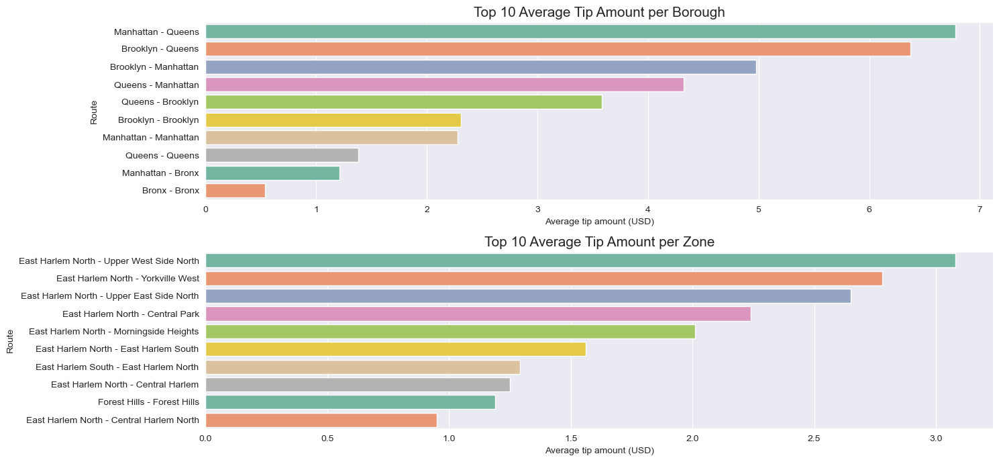

In [110]:
plt.figure(figsize=(15,10))

data_borough = trip_amount_borough.sort_values(by='avg_tip', ascending=False)
data_zone = trip_amount_zone.sort_values(by='avg_tip', ascending=False)

plt.subplot(3,1,1)
bars = sns.barplot(data=data_borough,
                   y='Route', 
                   x='avg_tip', 
                   palette=color)


plt.xlabel('Average tip amount (USD)')
plt.ylabel('Route')
plt.title('Top 10 Average Tip Amount per Borough', fontsize=15)

plt.subplot(3,1,2)
bars = sns.barplot(data=data_zone,
                   y='Route', 
                   x='avg_tip', 
                   palette=color)

    
plt.xlabel('Average tip amount (USD)')
plt.ylabel('Route')
plt.title('Top 10 Average Tip Amount per Zone', fontsize=15)

plt.tight_layout() 
plt.show()

- Based on the chart above, the most popular route with the highest average tip amount is `Manhattan-Queens` with about $6.5 per borough.

- While the most popular route per zone with the highest average tip amount is `East Harlem North-UpperWest Side North` with around `3$`.

- We tried to find the average tip amount by delivery zone and the largest proportion of tips from a fare.

In [111]:
# Count tip amount group by dropoff zone
tip_do_amount = df.groupby('DOZone').agg(count=('tip_amount', 'count'), 
                                     total_tip=('tip_amount', 'sum'), 
                                     avg_tip=('tip_amount', 'mean'), 
                                     avg_fare=('fare_amount', 'mean')).reset_index()
# Adding proportion of tip from a fare
tip_do_amount['proportion_of_tip'] = (tip_do_amount['avg_tip']/tip_do_amount['avg_fare']*100).round(2)

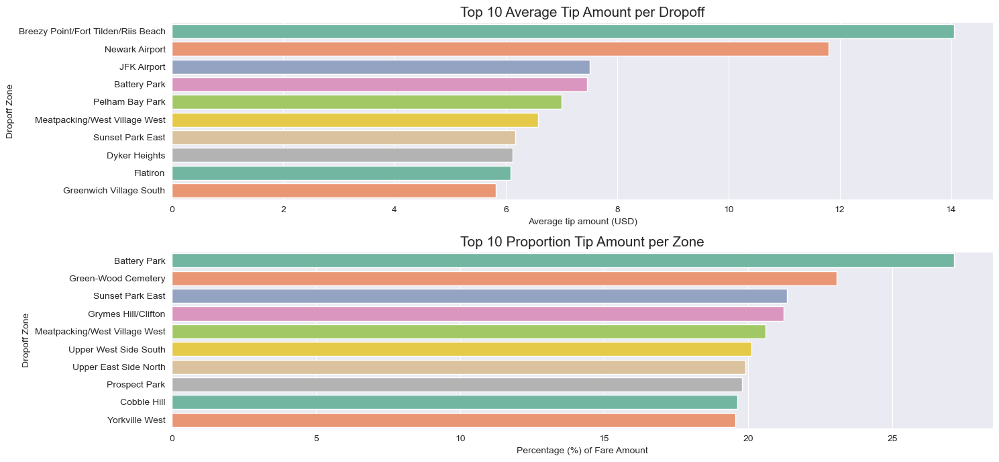

In [112]:
plt.figure(figsize=(15,10))

avg_tip_sort = tip_do_amount.sort_values('avg_tip', ascending=False).head(10)
proportion_sort=tip_do_amount.sort_values('proportion_of_tip', ascending=False).head(10)

plt.subplot(3,1,1)
bars = sns.barplot(data=avg_tip_sort,
                   y='DOZone', 
                   x='avg_tip', 
                   palette=color)


plt.xlabel('Average tip amount (USD)')
plt.ylabel('Dropoff Zone')
plt.title('Top 10 Average Tip Amount per Dropoff', fontsize=15)

plt.subplot(3,1,2)
bars = sns.barplot(data=proportion_sort,
                   y='DOZone', 
                   x='proportion_of_tip', 
                   palette=color)

    
plt.xlabel('Percentage (%) of Fare Amount')
plt.ylabel('Dropoff Zone')
plt.title('Top 10 Proportion Tip Amount per Zone', fontsize=15)

plt.tight_layout() 
plt.show()

- The most average tip amount based on dropoff zone is `Breezy Point/Fort Tilden/Rils Beach` around `14$` followed by `Newark Airport` around `11$`

- And the most proportion tip amount is `Battery Park` with more than `25%` from fare amount followed by `Green-Wood Century` with around `23%` from fare amount.

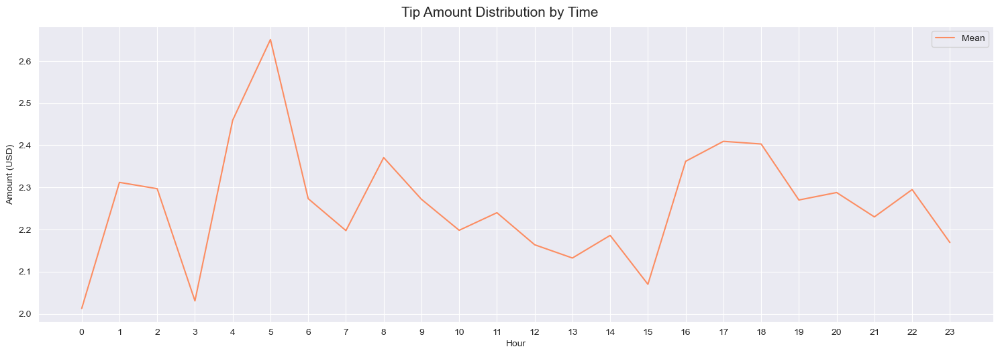

In [113]:
plt.figure(figsize=(15,10))
plt.suptitle('Tip Amount Distribution by Time', fontsize=15)

plt.subplot(2,1,1)
sns.lineplot(data=amount_by_hour, 
             x='lpep_pickup_datetime', 
             y='avg_tip_amount', 
             color=color[1],
             label = 'Mean')

plt.xlabel('Hour')
plt.xticks(np.arange(0,24,1))
plt.ylabel('Amount (USD)')

plt.tight_layout()
plt.show()

- From the line chart above, average tip amount reached the highest amount around `5am` and the lowest amount at `12am`

- We seen that the tip amount is get reduced at around `10am-3pm` and then getting raise at around `3pm-7pm`

# Tip Amount Correlation

### Tip Amount Correlation with numerical feature

In [114]:
df_tip_corr = df[['PULocationID', 'DOLocationID', 'trip_distance', 'duration', 'speed', 'fare_amount', 'tip_amount']][df['tip_amount']>0]
df_tip_corr.head()

,PULocationID,DOLocationID,trip_distance,duration,speed,fare_amount,tip_amount
0,166,143,2.58,11.02,14.05,14.9,4.03
1,24,43,1.81,6.77,16.04,10.7,2.64
2,41,238,1.30,5.82,13.40,6.5,1.70
5,181,45,3.80,17.42,13.09,19.1,4.85
7,41,166,1.11,4.95,13.45,7.2,1.00


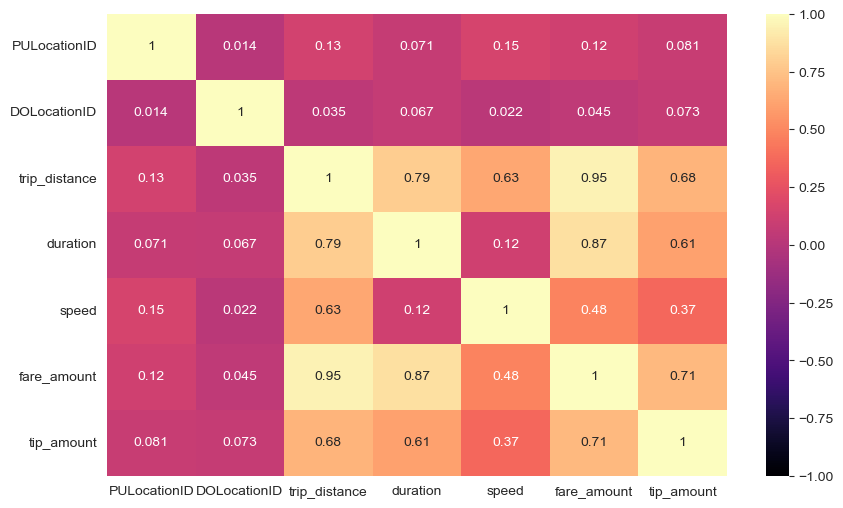

In [115]:
plt.figure(figsize=(10,6))
sns.heatmap(df_tip_corr.corr(), vmin=-1, vmax=1, annot=True, cmap='magma')
plt.show()

From the correlation heatmap above, it can be seen that there are several features that have a strong correlation with tip_amount.

- `0.68` with trip_distance, this correlation is quite large so that the longer the distance traveled, the greater the tip amount given

- `0.61` with duration, this correlation is also quite large where the longer the duration of the trip, the larger the tip amount given

- `0.71` with fare amount, this correlation is the largest with tip amount where if the fare amount is greater then the tip amount given is also greater

- So based on the correlation above, features such as distance and duration are factors that affect the tip amount where the farther and longer the duration, the more likely the tip will be given more bigger, while the most determining factor is the fare amount where passengers tend to tip based on a percentage of the total fare so it is natural that the greater the fare amount, the greater the tip that will be given.

### Tip Amount Correlation with categorical feature

In [120]:
categorical_df = df.select_dtypes(include=['object', 'category'])

categorical_df.columns

Index(['RatecodeID', 'passenger_count', 'payment_type', 'trip_type',
       'PUBorough', 'PUZone', 'DOBorough', 'DOZone', 'time_zone', 'day_type',
       'distance_category', 'duration_category', 'speed_category',
       'fare_category', 'tip_category'],
      dtype='object')

#### Location (Dropoff per Borough)

In [139]:
borough_tip_corr = df[df['tip_amount']>0][['DOBorough', 'tip_amount']]
count_borough= borough_tip_corr['tip_amount'].groupby(borough_tip_corr['DOBorough']).count()
borough_tip_corr = borough_tip_corr[borough_tip_corr['DOBorough'].isin(count_borough[count_borough > 100].index)]

ct_tip_borough = borough_tip_corr.groupby('DOBorough').agg(count=('tip_amount', 'count'), avg_tip=('tip_amount', 'mean'), median_tip=('tip_amount', 'median')).round(2).reset_index()
ct_tip_borough

,DOBorough,count,avg_tip,median_tip
0,Bronx,684,3.22,2.70
1,Brooklyn,4523,3.75,3.06
2,Manhattan,24953,3.59,3.06
3,Queens,6875,4.13,3.06


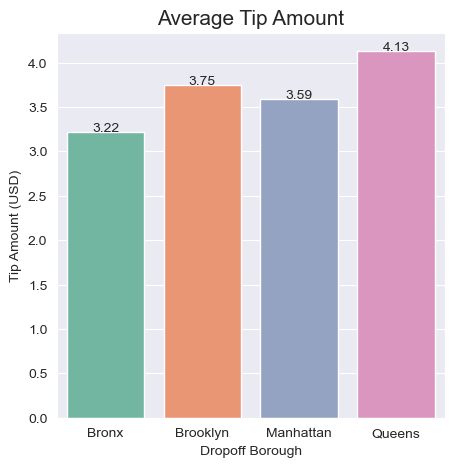

In [140]:
plt.figure(figsize=(5,5))

bars = sns.barplot(data=ct_tip_borough, x='DOBorough', y='avg_tip', ci=0, palette=color)
for idx, bar in enumerate(bars.patches):
    x_value = bar.get_x() + bar.get_width() / 2
    y_value = bar.get_height() + 0.01
    label = "{:.2f}".format(ct_tip_borough['avg_tip'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center')

plt.xlabel('Dropoff Borough')
plt.ylabel('Tip Amount (USD)')
plt.title('Average Tip Amount', fontsize=15)
plt.show()

**Hypothesis:**

**Ho**: Median Tip By Dropoff Location Category Bronx = Brooklyn = Manhattan = Queens

**Ha**: There is at least one pair that is not equal (and we don't know which one)

In [141]:
stat, pvalue= kruskal(
    borough_tip_corr[borough_tip_corr['DOBorough'] == 'Bronx']['tip_amount'].sample(100, random_state=0),
    borough_tip_corr[borough_tip_corr['DOBorough'] == 'Brooklyn']['tip_amount'].sample(100, random_state=0),
    borough_tip_corr[borough_tip_corr['DOBorough'] == 'Manhattan']['tip_amount'].sample(100, random_state=0),
    borough_tip_corr[borough_tip_corr['DOBorough'] == 'Queens']['tip_amount'].sample(100, random_state=0),
)

print('p-Value', pvalue)

if pvalue > 0.05:
    print('Terima H0')
else:
    print('Tolak H0')

p-Value 0.021557444780813263
Tolak H0


- From the hypothesis test results, we can prove that **there is a significant difference in tip_amount** between at least two of the dropoff locations that have at least 100 transactions.

- Therefore, it can be said that `location can affect the tip_amount given by passengers`.

#### Day Type

In [118]:
daycat_tip_corr = df[df['tip_amount']>0][['day_type', 'tip_amount']]
ct_tip_daycat = daycat_tip_corr.groupby('day_type').agg(count=('tip_amount', 'count'), avg_tip=('tip_amount', 'mean'), median_tip=('tip_amount', 'median')).round(2).reset_index()
ct_tip_daycat

,day_type,count,avg_tip,median_tip
0,Weekdays,27824,3.69,3.05
1,Weekend,9227,3.76,3.09


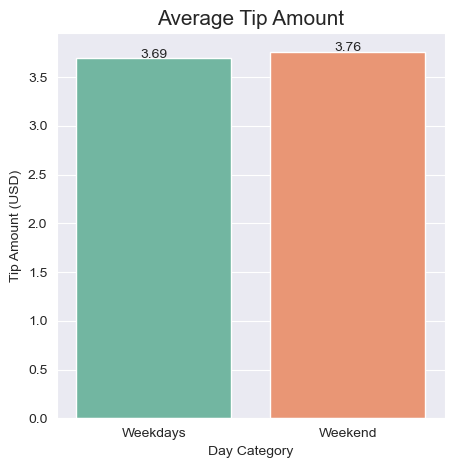

In [119]:
plt.figure(figsize=(5,5))

bars = sns.barplot(data=ct_tip_daycat, x='day_type', y='avg_tip', ci=0, palette=color)
for idx, bar in enumerate(bars.patches):
    x_value = bar.get_x() + bar.get_width() / 2
    y_value = bar.get_height() + 0.01
    label = "{:.2f}".format(ct_tip_daycat['avg_tip'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center')

plt.xlabel('Day Category')
plt.ylabel('Tip Amount (USD)')
plt.title('Average Tip Amount', fontsize=15)
plt.show()

**Hypothesis**:

**Ho**: average tip on weekends = average tip on weekdays

**Ha**: average tip on weekends <>average tip on weekdays

In [122]:
stat, pvalue= mannwhitneyu(
    daycat_tip_corr[daycat_tip_corr['day_type'] == 'Weekend']['tip_amount'].sample(100, random_state=0),
    daycat_tip_corr[daycat_tip_corr['day_type'] == 'Weekdays']['tip_amount'].sample(100, random_state=0),
    alternative='two-sided'
)

print('p-Value', pvalue)

if pvalue > 0.05:
    print('Terima H0')
else:
    print('Tolak H0')

p-Value 0.04828348618015329
Tolak H0


- Based on the hypothesis test results, this result proves that the `average of the tip value on weekdays is smaller than the tip on weekends`.

#### Time zone

In [143]:
putime_tip_corr = df[df['tip_amount']>0][['time_zone', 'tip_amount']]
ct_tip_putime = putime_tip_corr.groupby('time_zone').agg(count=('tip_amount', 'count'), avg_tip=('tip_amount', 'mean'), median_tip=('tip_amount', 'median')).round(2).reset_index()
ct_tip_putime

,time_zone,count,avg_tip,median_tip
0,Afternoon,11556,3.79,3.14
1,Evening,11957,3.60,3.08
2,Late Night,3721,3.95,3.12
3,Morning,9817,3.63,2.99


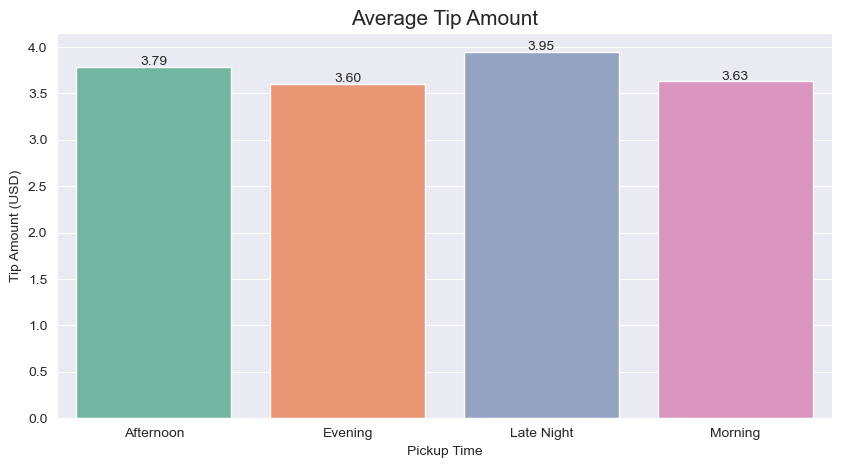

In [144]:
plt.figure(figsize=(10,5))

bars = sns.barplot(data=ct_tip_putime, x='time_zone', y='avg_tip', ci=0, palette=color)
for idx, bar in enumerate(bars.patches):
    x_value = bar.get_x() + bar.get_width() / 2
    y_value = bar.get_height() + 0.02
    label = "{:.2f}".format(ct_tip_putime['avg_tip'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center')
    
plt.xlabel('Pickup Time')
plt.ylabel('Tip Amount (USD)')
plt.title('Average Tip Amount', fontsize=15)
plt.show()

**Hypothesis:**

**Ho**: Median Tip By Time Category Afternoon = Evening = Late Night = Morning

**Ha**: There is at least one pair that is not equal (and we don't know which one)

In [145]:
from scipy.stats import kruskal

stat, pvalue= kruskal(
    putime_tip_corr[putime_tip_corr['time_zone'] == 'Afternoon']['tip_amount'].sample(100, random_state=0),
    putime_tip_corr[putime_tip_corr['time_zone'] == 'Evening']['tip_amount'].sample(100, random_state=0),
    putime_tip_corr[putime_tip_corr['time_zone'] == 'Late Night']['tip_amount'].sample(100, random_state=0),
    putime_tip_corr[putime_tip_corr['time_zone'] == 'Morning']['tip_amount'].sample(100, random_state=0),
)

print('p-Value', pvalue)

if pvalue > 0.05:
    print('Terima H0')
else:
    print('Tolak H0')

p-Value 0.6874203341208204
Terima H0


- From the hypothesis test results, we can prove that **there is no significant difference in tip_amount** between at least two of the dropoff locations that have at least 100 transactions.

- Therefore, it can be said that `time zone is not affected the tip_amount given by passengers`.

#### Trip Type

In [146]:
trip_type_tip_corr = df[df['tip_amount']>0][['trip_type', 'tip_amount']]
ct_tip_trip_type= trip_type_tip_corr.groupby('trip_type').agg(count=('tip_amount', 'count'), avg_tip=('tip_amount', 'mean'), median_tip=('tip_amount', 'median')).round(2).reset_index()
ct_tip_trip_type

,trip_type,count,avg_tip,median_tip
0,Dispatch,241,6.97,5.00
1,Street-hail,36810,3.68,3.05


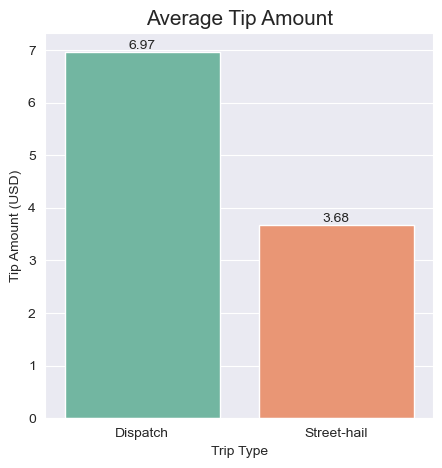

In [149]:
plt.figure(figsize=(5,5))

bars = sns.barplot(data=ct_tip_trip_type, x='trip_type', y='avg_tip', ci=0, palette=color)
for idx, bar in enumerate(bars.patches):
    x_value = bar.get_x() + bar.get_width() / 2
    y_value = bar.get_height() + 0.05
    label = "{:.2f}".format(ct_tip_trip_type['avg_tip'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center')

plt.xlabel('Trip Type')
plt.ylabel('Tip Amount (USD)')
plt.title('Average Tip Amount', fontsize=15)

plt.show()

**Hypothesis**:

**Ho**: Average tip on street-hail trip type = Median tip on app trip type.

**Ha**: Average tip on street-hail trip type < Median tip on app trip type

In [148]:
from scipy.stats import mannwhitneyu

stat, pvalue= mannwhitneyu(
    trip_type_tip_corr[trip_type_tip_corr['trip_type'] == 'Street-hail']['tip_amount'].sample(100, random_state=0),
    trip_type_tip_corr[trip_type_tip_corr['trip_type'] == 'Dispatch']['tip_amount'].sample(100, random_state=0),
    alternative='less'
)

print('p-Value', pvalue/2)

if pvalue > 0.05:
    print('Terima H0')
else:
    print('Tolak H0')

p-Value 1.9047960809588414e-05
Tolak H0


- Based on the hypothesis test results, this result proves that the `average of the tip value on street-hail is smaller than the tip on dispatch`.

#### Ratecode

In [150]:
ratecode_tip_corr = df[df['tip_amount']>0][['RatecodeID', 'tip_amount']]
ct_tip_ratecode= ratecode_tip_corr.groupby('RatecodeID').agg(count=('tip_amount', 'count'), avg_tip=('tip_amount', 'mean'), median_tip=('tip_amount', 'median')).round(2).reset_index()
ct_tip_ratecode

,RatecodeID,count,avg_tip,median_tip
0,JFK Airport,124,15.18,15.61
1,Negotiated fare,283,6.50,5.00
2,Newark Airport,7,20.09,21.99
3,Standard rate,36637,3.64,3.05


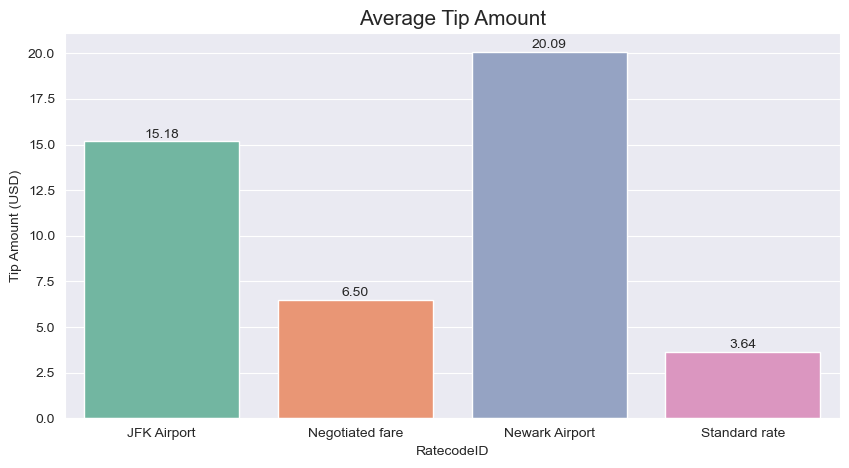

In [151]:
plt.figure(figsize=(10,5))

bars = sns.barplot(data=ct_tip_ratecode, x='RatecodeID', y='avg_tip', ci=0, palette=color)
for idx, bar in enumerate(bars.patches):
    x_value = bar.get_x() + bar.get_width() / 2
    y_value = bar.get_height() + 0.2
    label = "{:.2f}".format(ct_tip_ratecode['avg_tip'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center')

plt.xlabel('RatecodeID')
plt.ylabel('Tip Amount (USD)')
plt.title('Average Tip Amount', fontsize=15)
plt.show()

**Hypothesis:**

**Ho**: Average Tip With Ratecode Standard Rate = JFK Airport = Newark Airport = Nassau or Westchester = Negotiated fare.

**Ha**: There is at least one pair that is not equal (and we don't know which one)

In [152]:
stat, pvalue= kruskal(
    ratecode_tip_corr[ratecode_tip_corr['RatecodeID'] == 'Standard rate']['tip_amount'].sample(7, random_state=0),
    ratecode_tip_corr[ratecode_tip_corr['RatecodeID'] == 'JFK Airport']['tip_amount'].sample(7, random_state=0),
    ratecode_tip_corr[ratecode_tip_corr['RatecodeID'] == 'Newark Airport']['tip_amount'].sample(7, random_state=0),
    ratecode_tip_corr[ratecode_tip_corr['RatecodeID'] == 'Negotiated fare']['tip_amount'].sample(7, random_state=0),
)

print('p-Value', pvalue)

if pvalue > 0.05:
    print('Terima H0')
else:
    print('Tolak H0')

p-Value 0.0017915949414859767
Tolak H0


- From the hypothesis test results, we can prove that **there is significant difference in tip_amount** between at least two of the dropoff locations that have at least 100 transactions.

- Therefore, it can be said that `Rate code type is affect the tip_amount given by passengers`.

#### Distance Category

In [153]:
tip_distance = df[df['tip_amount']>0][['tip_amount', 'distance_category']]
ct_tip_distance = tip_distance.groupby('distance_category').agg(count=('tip_amount', 'count'), avg_tip=('tip_amount', 'mean'), median_tip=('tip_amount', 'median')).reset_index().round(2)
ct_tip_distance

,distance_category,count,avg_tip,median_tip
0,3-6 miles,15737,4.06,4.00
1,7-10 miles,2920,6.84,7.14
2,<2 miles,17449,2.49,2.44
3,>10 miles,945,10.62,10.55


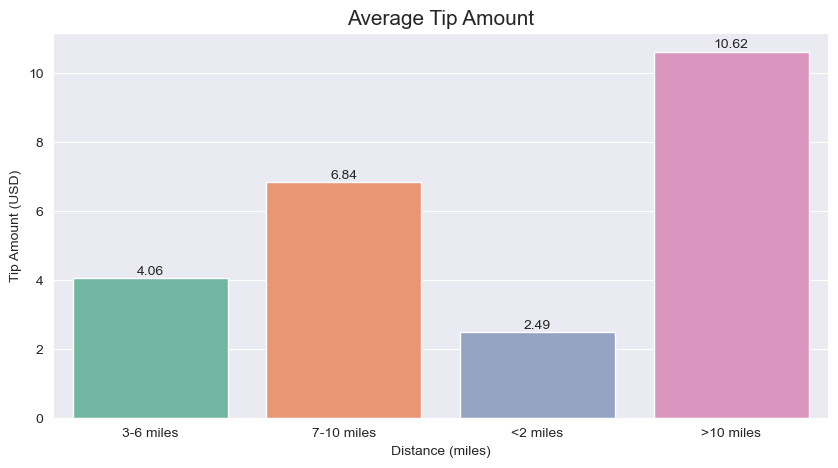

In [154]:
plt.figure(figsize=(10,5))

bars = sns.barplot(data=ct_tip_distance, x='distance_category', y='avg_tip', ci=0, palette=color)
for idx, bar in enumerate(bars.patches):
    x_value = bar.get_x() + bar.get_width() / 2
    y_value = bar.get_height() + 0.1
    label = "{:.2f}".format(ct_tip_distance['avg_tip'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center')

plt.xlabel('Distance (miles)')
plt.ylabel('Tip Amount (USD)')
plt.title('Average Tip Amount', fontsize=15)
plt.show()

**Hypothesis**:

**Ho**: Average tip on trips with distance <2 miles = 3-6 miles = 7-10 miles = >10 miles.

**Ha**: Average tip for one of the distances has significantly unequal values

In [155]:
stat, pvalue= kruskal(
    tip_distance[tip_distance['distance_category'] == '<2 miles']['tip_amount'].sample(100, random_state=0),
    tip_distance[tip_distance['distance_category'] == '3-6 miles']['tip_amount'].sample(100, random_state=0),
    tip_distance[tip_distance['distance_category'] == '7-10 miles']['tip_amount'].sample(100, random_state=0),
    tip_distance[tip_distance['distance_category'] == '>10 miles']['tip_amount'].sample(100, random_state=0)
)

print('p-Value', pvalue)

if pvalue > 0.05:
    print('Terima H0')
else:
    print('Tolak H0')

p-Value 5.494884208977325e-34
Tolak H0


- From the hypothesis test results, we can prove that **there is significant difference in tip_amount** between at least two of the dropoff locations that have at least 100 transactions.

- Therefore, it can be said that `Distance is affect the tip_amount given by passengers`.

#### Duration Category

In [156]:
tip_duration = df[df['tip_amount']>0][['tip_amount', 'duration_category']]
ct_tip_duration = tip_duration.groupby('duration_category').agg(count=('tip_amount', 'count'), avg_tip=('tip_amount', 'mean'), median_tip=('tip_amount', 'median')).round(2).reset_index()
ct_tip_duration

,duration_category,count,avg_tip,median_tip
0,15-30 minutes,10820,4.84,4.70
1,5-15 minutes,22006,2.91,2.80
2,<5 minutes,2223,2.02,1.95
3,>30 minutes,2002,8.24,7.80


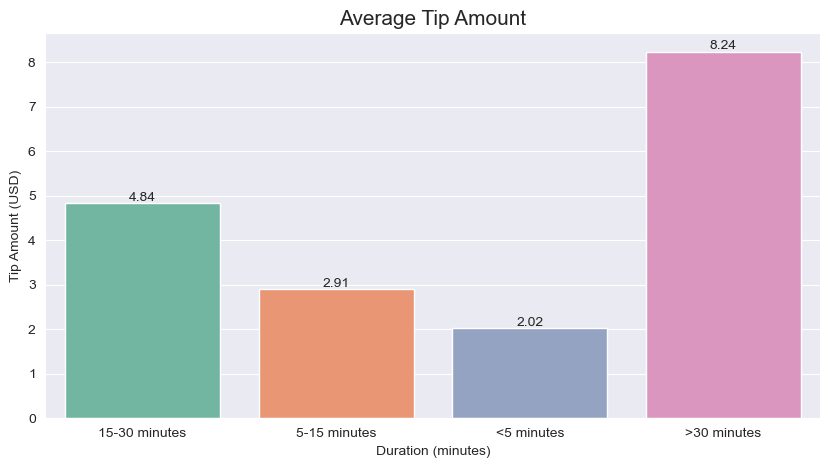

In [157]:
plt.figure(figsize=(10,5))

bars = sns.barplot(data=ct_tip_duration, x='duration_category', y='avg_tip', ci=0, palette=color)
for idx, bar in enumerate(bars.patches):
    x_value = bar.get_x() + bar.get_width() / 2
    y_value = bar.get_height() + 0.05
    label = "{:.2f}".format(ct_tip_duration['avg_tip'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center')

plt.xlabel('Duration (minutes)')
plt.ylabel('Tip Amount (USD)')
plt.title('Average Tip Amount', fontsize=15)
plt.show()

**Hypothesis**:

**Ho**: Average tip on trips with trip duration <10 minutes = 11-20 minutes = 21-30 minutes = >30 minutes.

**Ha**: The average tip of one of the duration groups has a significantly different value

In [158]:
stat, pvalue= kruskal(
    tip_duration[tip_duration['duration_category'] == '<5 minutes']['tip_amount'].sample(100, random_state=0),
    tip_duration[tip_duration['duration_category'] == '5-15 minutes']['tip_amount'].sample(100, random_state=0),
    tip_duration[tip_duration['duration_category'] == '15-30 minutes']['tip_amount'].sample(100, random_state=0),
    tip_duration[tip_duration['duration_category'] == '>30 minutes']['tip_amount'].sample(100, random_state=0)
)

print('p-Value', pvalue)

if pvalue > 0.05:
    print('Terima H0')
else:
    print('Tolak H0')

p-Value 1.2142385125411633e-32
Tolak H0


- From the hypothesis test results, we can prove that **there is significant difference in tip_amount** between at least two of the dropoff locations that have at least 100 transactions.

- Therefore, it can be said that `Duration is affect the tip_amount given by passengers`.

#### Fare Amount Category

In [159]:
tip_fare = df[df['tip_amount']>0][['tip_amount', 'fare_category']]
ct_tip_fare = tip_fare.groupby('fare_category').agg(count=('tip_amount', 'count'), avg_tip=('tip_amount', 'mean'), median_tip=('tip_amount', 'median')).round(2).reset_index()
ct_tip_fare

,fare_category,count,avg_tip,median_tip
0,21-40$,7893,5.44,5.46
1,41-60$,1091,8.71,9.43
2,<20$,27729,2.89,2.80
3,>60$,338,14.01,15.60


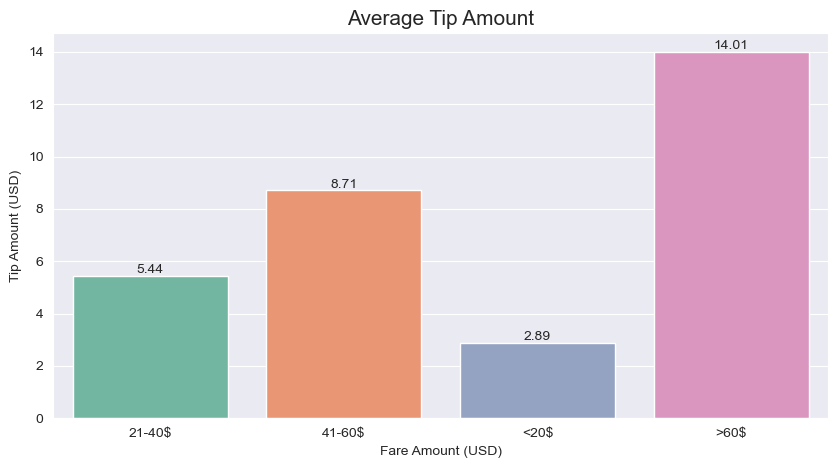

In [160]:
plt.figure(figsize=(10,5))

bars = sns.barplot(data=ct_tip_fare, x='fare_category', y='avg_tip', ci=0, palette=color)
for idx, bar in enumerate(bars.patches):
    x_value = bar.get_x() + bar.get_width() / 2
    y_value = bar.get_height() + 0.1
    label = "{:.2f}".format(ct_tip_fare['avg_tip'].iloc[idx]) 
    plt.text(x_value, y_value, label, ha='center')

plt.xlabel('Fare Amount (USD)')
plt.ylabel('Tip Amount (USD)')
plt.title('Average Tip Amount', fontsize=15)
plt.show()

**Hypothesis**:

**Ho**: Average tip on fare amount <20$ = 21-40$ = 41-60$ = >60$

**Ha**: Average tip of one of the fare_amount groups has a significantly different value.

In [161]:
stat, pvalue= kruskal(
    tip_fare[tip_fare['fare_category'] == '<20$']['tip_amount'].sample(100, random_state=0),
    tip_fare[tip_fare['fare_category'] == '21-40$']['tip_amount'].sample(100, random_state=0),
    tip_fare[tip_fare['fare_category'] == '41-60$']['tip_amount'].sample(100, random_state=0),
    tip_fare[tip_fare['fare_category'] == '>60$']['tip_amount'].sample(100, random_state=0)
)

print('p-Value', pvalue)

if pvalue > 0.05:
    print('Terima H0')
else:
    print('Tolak H0')

p-Value 1.3155651048555217e-37
Tolak H0


- From the hypothesis test results, we can prove that **there is significant difference in tip_amount** between at least two of the dropoff locations that have at least 100 transactions.

- Therefore, it can be said that `Fare Amount is affect the tip_amount given by passengers`.

**Tips Correlation Conclusion**

So there are factors that affect the amount of tip amount given on each trip that occurs, namely location, weekend days, rate code, trip type.

In addition, the greater the distance, duration, and fare amount achieved, the greater the tip given by the passenger.

factors that do not affect the amount of tips given are speed and morning-evening time.

# Analysis Conclusion and Recommendation

`Understanding trip distribution based on time and location to Optimize taxi fleet distribution`

**Conclusion**

- The result show that frequency trips occur mostly in the borough of `manhattan` especially in the zone of `east harlem` both north and south, but north side has the highest value with 12,592 passenger for a month. 

- The next most crowded borough is `Queens` with 15,554 passengers with the largest area of `forest hill` with 3,542 passengers for a month. The third one is borough `Brooklyn` with 8,071 passengers for a month.

- The `highest` of trip frequency was on `January 25, 2023`, while the `lowest` frequency was on `January 1, 2023`, which was the day of the New Year celebration.

- `75.19%` of the trip frequency occurs on `weekdays` which is usually weekdays during which people work or go to school.

- The day with the largest proportion is `Tuesday` while the lowest is `Sunday` which every weekend the percentage reduced by 1%-2% from weekdays.

- The time of day that has the highest number occurs in the `afternoon` followed by `evening` (15-22 pm) which is the time when people return home from work in that afternoon and evening.

- Passengers start to get crowded from `11pm` to `7pm` on weekdays.

- The most crowded hours start from around `2pm` to `6pm` on weekdays. It can be reach around 700 passengers when crowded hours with peaked at `Tuesday` on `6pm` on `799` passengers.

- While the lowest number occurs during the hours around `12-6am` with the lowest number on Thursday with `85` passengers.

- So it can be concluded through the distribution of this data that it is likely that the `highest majority of passengers are people returning from work based on the time pattern and peak hours` of people booked a taxi.


**Recommendation**

Through the conclusion of the analysis results there are recommendations related to the distribution strategy of taxi fleet deployment in NYC.

- Increasing the number of taxis in Manhattan as the city with the largest trip frequency, followed by Queens and Brooklyn.

- Increasing the number of taxis in these areas on weekdays during the hours around 7 am - 8 pm and reducing the number of taxis at other times due to low demand.

- Reduced number of taxis in low demand areas such as Staten Island.

- Adjustments to reduce the number of taxi operations on weekend days in predominantly employee areas such as Manhattan, Queens, and Brooklyn.

For this taxi distribution, the main focus of passengers is the workers in NYC because the majority of the demand comes from them.


`Understanding customer behaviour and preferences to enhance customer loyalty and satisfaction`

**Conclusion**

- The majority distance traveled by passengers is `less than 2 miles` at `49,29%` and the lowest distance is `more than 10 miles` at only `2,54%`.

- The duration of trips taken by passengers is mostly `5-15 minutes` with `60,15%` of trips while the least duration is `more than 30 minutes` with only `5,71%` of trips.

- The number of passengers booking a taxi is mostly one person passengers with `86,23%`.

- The distance that passenger covered is mostly using `standard rate` with trip type `street-hail` which is around `60,000` passengers.

- The preferred type of payment for passengers is by using a `credit card` with around `40,000` transactions while cash with around `19,000` transactions.

**Recommendation**

Through the conclusion of the analysis results there are recommendations related to the passenger behavior and preference to increase passenger service.

- Mainly focus on the procurement of taxis that are sufficient to handle the large number of requests at congested locations and times because the majority of passengers are traveling within the city.

- Improve service and taxi booking application system due to low demand through the application so that passengers are more likely to consider booking a taxi through the application.

- Provide a good and adequate payment system because as a result, more people now prefer to use credit cards than cash because it is more practical.

- Provision of other payment systems such as e-wallets is also a new alternative that can be added and incorporated into the application system to make it more practical in making reservations and payments.

- To increase passenger loyalty, you can also add bonus gifts or discounts on services in the application.

One of the new recommendations and innovations is the step of optimizing services on the application to increase bookings on the application and facilitate passenger transactions. In addition, the provision of bonuses and discounts to help increase the number of bookings to farther places can also be done.

`Identifying fare revenue to analyses to maximize revenue by adjusting the price`

**Conclusion**

- Based from the graph above, most popular route per borough with the highest average fare amount per borough is `Brooklyn-Queens` with average `40$`

- Based from the graph above, most popular route per zone with the highest average fare amount per borough is `East Harlem Nort-Upper West Side North` with average `16$`

- The highest average fare amount is happening in `late night` especially around `1am-5am` before morning time

- The fare amount is significantly consistent in the `morning` until afternoon but it reached lowest amount when it already evening around `6pm-9pm`

**Recommendation**

Through the conclusion of the analysis results there are recommendations related to the passenger behavior and preference to increase passenger service.

- For high-revenue zones, like the East Harlem North to Upper West Side North route, try premium pricing given the consistent high fare. 

- Alternatively, introducing value-added services (like in-app perks or loyalty points for frequent routes) could maintain or even increase demand without affecting the revenue stream.

- Organize event-based promos or discounts in a route that have high traffic such Brooklyn-Queens and fares to attract passengers to continue using taxis even during off-peak times.

- Offer promos or discounts during times of low demand, such as midnight or early morning, to attract more customers.

Maintaining fare values on routes that already have high fare values can also be done with loyalty programs and event or weekly discounts to attract passengers even at low demand times. In addition, providing discounts and other attractive offers to increase routes and times that have low demand.


`Identifying tip behaviours that encourage passenger to pay tips`

**Conclusion**

- The most popular route with the highest average tip amount is `Manhattan-Queens` with about $6.5 per borough.

- While the most popular route per zone with the highest average tip amount is `East Harlem North-UpperWest Side North` with around `3$`.

- The most average tip amount based on dropoff zone is `Breezy Point/Fort Tilden/Rils Beach` around `14$` followed by `Newark Airport` around `11$`

- And the most proportion tip amount is `Battery Park` with more than `25%` from fare amount followed by `Green-Wood Century` with around `23%` from fare amount.

- Average tip amount reached the highest amount around `5am` and the lowest amount at `12am`

 - So based on the correlation, features such as distance and duration are factors that affect the tip amount where the `farther and longer the duration, the more likely the tip will be given more bigger`, while `the most determining factor is the fare amount` where passengers tend to tip based on a percentage of the total fare so it is natural that the greater the fare amount, the greater the tip that will be given.

- So there are factors that affect the amount of tip amount given on each trip that occurs, namely `location`, `weekend days`, `rate code`, `trip type`. In addition, `the greater the distance, duration, and fare amount achieved, the greater the tip given by the passenger`.

**Recommendation**

- Encourage or socialize for reminders to passengers to tip drivers, especially on routes with high average tips such as Manhattan-Queen.

- Promote areas that have a high portion and value of tips such as Breezy Point/Fort Tilden/Rils Beach, battery park and other tourist attractions followed by discounts to attract more attention.

 - Implement a small in-app icon or suggestion that shows passengers how their tips contribute to supporting drivers. This could serve as a reminder for passengers to tip and show appreciation, especially on routes associated with high tips.

- Since weekend trips have higher tipping potential, run special weekend promotions with subtle prompts that remind riders of the tipping culture.

- Use clear and transparent rate code definitions (e.g., airport surcharge or holiday surcharge) to help customers understand and anticipate additional costs. This transparency can help build trust and encourage generous tipping when passenger feel they’re treated fairly and not surprised by unexpected charges.